In [1]:
# SYNTHETIC SCENE SETUP
import ivt
from ivt.scene import Scene, DiffuseBRDF, MicrofacetBRDF, Mesh, \
    PerspectiveCamera, HDRFilm, Integrator, EnvironmentLight
from ivt.io import read_image, read_mesh, write_image
from ivt.sampling import sample_sphere

from matplotlib import pyplot as plt
import torch
import numpy as np
from tqdm.notebook import tqdm

scene = Scene()

# material
SPECULAR=0.04
scene.set('mat', MicrofacetBRDF(0.3, SPECULAR, 0.3))
scene.set('mesh1', Mesh.from_file("assets/meshes/sphere.obj", 'mat')) # surface to reconstruct
scene.set('film', HDRFilm(256, 256))
scene.set('integrator', Integrator('collocated', {'intensity':1}))
# scene.set('cam1', PerspectiveCamera.from_lookat(fov=40, origin=(1,0.5,0), target=(0,0,0), up=(0,1,0))) # camera

# randomly generate cameras
num_sensors = 1
fov = 40
radius = 1
target = (0,0,0)
up = (0,1,0)
for i, origin in enumerate(sample_sphere(num_sensors, radius, 'fibonacci')):
    scene.set(f'sensor {i}', PerspectiveCamera.from_lookat(fov, origin, target, up))

# render target images
renderer = ivt.renderer.Renderer(connector_name='psdr_jit', render_options = {
    "spp": 16,
    "sppe": 0,
    "sppse": 0,
    "npass": 1,
    "log_level": 0
})
# because ivt has a glitch that doesn't update changes in spp, workaround here to render a higher spp target image
renders = torch.stack([renderer(scene, sensor_ids=range(num_sensors)) for _ in tqdm(range(100))])

  0%|          | 0/100 [00:00<?, ?it/s]

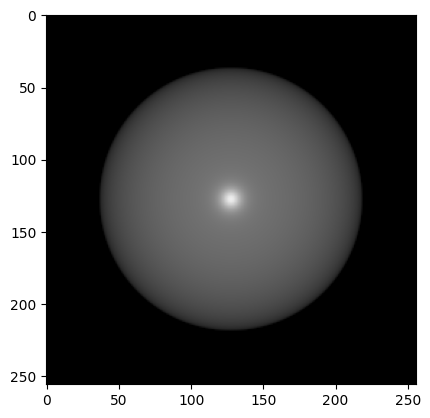

In [2]:
I_t = renders.mean(axis=0)
stddev = renders.std(axis=0)

# Visualize a target Image
def showimg(I):
    plt.imshow((I**0.454).detach().cpu().numpy().squeeze(), vmax=1)
showimg(I_t)

In [3]:
target = I_t[0,128,0:129,1]
target_dev = stddev[0,128,0:129,1]

In [4]:
target_dev*100

tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.1198, 0.0550, 0.0392, 0.0369, 0.0342, 0.0296, 0.0249, 0.0274,
        0.0261, 0.0240, 0.0238, 0.0224, 0.0211, 0.0214, 0.0232, 0.0180, 0.0210,
        0.0196, 0.0181, 0.0212, 0.0189, 0.0189, 0.0165, 0.0169, 0.0174, 0.0158,
        0.0154, 0.0156, 0.0150, 0.0156, 0.0161, 0.0151, 0.0159, 0.0134, 0.0126,
        0.0135, 0.0150, 0.0123, 0.0122, 0.0114, 0.0125, 0.0117, 0.0116, 0.0124,
        0.0118, 0.0101, 0.0106, 0.0093, 0.0108, 0.0099, 0.0099, 0.0089, 0.0103,
        0.0098, 0.0090, 0.0106, 0.0093, 0.0103, 0.0088, 0.0102, 0.0095, 0.0103,
        0.0097, 0.0093, 0.0103, 0.0128, 0.0129, 0.0143, 0.0148, 0.0156, 0.0188,
        0.0224, 0.0263, 0.0329, 0.0379, 

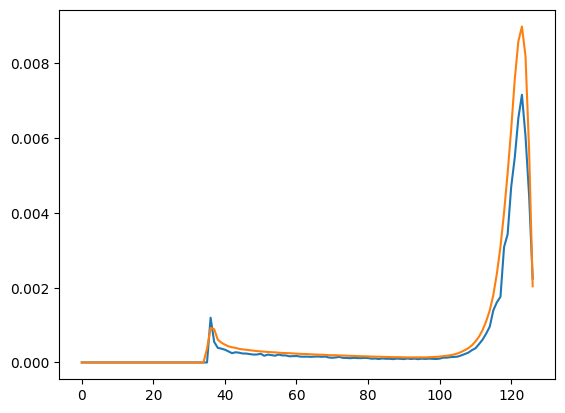

In [5]:
from math import sqrt
plt.plot(target_dev.cpu()[1:128])
plt.plot((target[2:129]-target[0:127]).cpu()/4/sqrt(16)*sqrt(2/3))

## Posterior distribution from each observed pixel

In [16]:
# render images on D&R, fix S parameter combinations
from tqdm.notebook import tqdm
res = 80
Us = []
X, Z = np.mgrid[0+0.5/res:1-0.5/res:1j*res, 0+0.5/res:1-0.5/res:1j*res]
X = X.flatten().astype('float32')
Z = Z.flatten().astype('float32')
Y = np.full_like(X, SPECULAR)
I = []
for i in tqdm(range(len(X))):
    xo = torch.tensor([X[i], Y[i], Z[i]]).cuda()
    scene['mat']['d'] = xo[0]
    scene['mat']['s'] = xo[1]
    scene['mat']['r'] = xo[2]
    img = renderer(scene)
    I.append(img[0,128,0:129,1])
I = torch.vstack(I)

  0%|          | 0/6400 [00:00<?, ?it/s]

In [17]:
from math import sqrt, pi
sigma = torch.tensor(0.05)
lpdf = (I - target).pow(2.0) / (2.0 * sigma.pow(2.0)) + (sigma*sqrt(2*pi)).log()

In [18]:
lpdf.min(), lpdf.max()

(tensor(-2.0768, device='cuda:0'), tensor(26206732., device='cuda:0'))

''

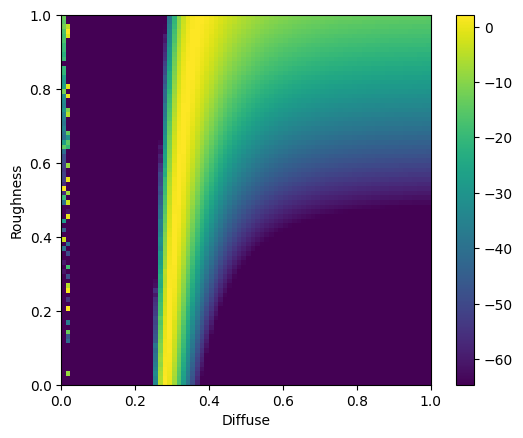

In [29]:
tensor = -lpdf[..., 128].reshape((res,res)).cpu().numpy()
a = np.quantile(tensor, 0.5)
plt.imshow(tensor, extent=[0, 1, 0, 1], origin='lower', vmin=a)
plt.xlabel("Diffuse")
plt.ylabel("Roughness")
plt.colorbar()
;

# def plot_distr(fig, ax, px):
#     tensor = -lpdf[..., px].reshape((res,res)).cpu().numpy()
# #     y = np.sin(frequency * x)
# #     ax.plot(x, y)
#     ax.set_title(f'observing pixel {px}')
#     a = np.quantile(tensor, 0.5)
#     cax = ax.imshow(tensor, extent=[0, 1, 0, 1], origin='lower', vmin=min(0,a))
#     ax.set_xlabel("Diffuse")
#     ax.set_ylabel("Roughness")
    
#     fig.colorbar(cax, ax=ax, orientation='vertical')
# #     ax.colorbar()
    
# observed_pixels = [40,60,80,100,120,128]
# n = len(observed_pixels)

# # Create the subplots
# fig, axarr = plt.subplots(n, 1, figsize=(4, 4 * n))

# # Generate a subplot for each frequency
# for i, px in enumerate(observed_pixels):
#     plot_distr(fig, axarr[i], px)
# #     fig.colorbar(axarr[i])

# plt.tight_layout()
# plt.show()

In [6]:
# render images on all parameter combinations
from tqdm.notebook import tqdm
res = 30
Us = []
X, Y, Z = np.mgrid[0+0.5/res:1-0.5/res:1j*res, 0+0.5/res:1-0.5/res:1j*res, 0+0.5/res:1-0.5/res:1j*res]
X = X.flatten().astype('float32')
Y = Y.flatten().astype('float32')
Z = Z.flatten().astype('float32')
I = []
for i in tqdm(range(len(X))):
    xo = torch.tensor([X[i], Y[i], Z[i]]).cuda()
    scene['mat']['d'] = xo[0]
    scene['mat']['s'] = xo[1]
    scene['mat']['r'] = xo[2]
    img = renderer(scene)
    I.append(img[0,128,0:129,1])
I = torch.vstack(I)

  0%|          | 0/27000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [7]:
# Save tensor to a file
torch.save(I, 'I30129.pt')
# Load tensor from a file
# I = torch.load('I30129.pt')
I.shape

torch.Size([27000, 129])

In [10]:
lpdf.shape

torch.Size([900, 129])

In [10]:
def log_add_torch(log_a, log_b):
    return torch.where(log_a < log_b,
                       log_b + torch.log1p(torch.exp(log_a - log_b)),
                       log_a + torch.log1p(torch.exp(log_b - log_a)))

def log_sum_along_axis_torch(tensor, axis):
    # Initialize with negative infinity tensor
    other_dims = [dim for i, dim in enumerate(tensor.shape) if i != axis]
    sum_log = torch.full(other_dims, float('-inf'), dtype=tensor.dtype, device=tensor.device)
    
    for i in range(tensor.shape[axis]):
        indexing_tuple = [slice(None) if j != axis else i for j in range(tensor.ndim)]
        sum_log = log_add_torch(sum_log, tensor[indexing_tuple])

    return sum_log

In [72]:
u = -lpdf.reshape((res,res,res,lpdf.shape[-1]))

In [85]:
def validate_plot_logsums_torch(tensor):
    # Compute log sums along each axis
    sum_diffuse = log_sum_along_axis_torch(tensor, 0)
    sum_specular = log_sum_along_axis_torch(tensor, 1)
    sum_roughness = log_sum_along_axis_torch(tensor, 2)
    print(log_sum_along_axis_torch(log_sum_along_axis_torch(sum_diffuse, 0), 0))
    print(log_sum_along_axis_torch(log_sum_along_axis_torch(sum_diffuse, 1), 0))
    print(log_sum_along_axis_torch(log_sum_along_axis_torch(sum_specular, 0), 0))
    print(log_sum_along_axis_torch(log_sum_along_axis_torch(sum_specular, 1), 0))
    print(log_sum_along_axis_torch(log_sum_along_axis_torch(sum_roughness, 0), 0))
    print(log_sum_along_axis_torch(log_sum_along_axis_torch(sum_roughness, 1), 0))
validate_plot_logsums_torch(u[...,128])

tensor([6.2061], device='cuda:0')
tensor([6.2061], device='cuda:0')
tensor([6.2061], device='cuda:0')
tensor([6.2061], device='cuda:0')
tensor([6.2061], device='cuda:0')
tensor([6.2061], device='cuda:0')


In [86]:
def plot_logsums_torch(tensor):
    # Compute log sums along each axis
    sum_diffuse = log_sum_along_axis_torch(tensor, 0)
    sum_specular = log_sum_along_axis_torch(tensor, 1)
    sum_roughness = log_sum_along_axis_torch(tensor, 2)

    # Convert back to numpy for plotting
    sum_diffuse_np = sum_diffuse.cpu().numpy()
    sum_specular_np = sum_specular.cpu().numpy()
    sum_roughness_np = sum_roughness.cpu().numpy()

    # Determine the common color scale for the plots
    vmin = min(sum_diffuse_np.min(), sum_specular_np.min(), sum_roughness_np.min())
    vmax = max(sum_diffuse_np.max(), sum_specular_np.max(), sum_roughness_np.max())
    
    # Flatten the tensors and compute the 1/3 quantile value to determine the 2/3 largest value.
    all_values = np.concatenate([sum_diffuse_np.ravel(), sum_specular_np.ravel(), sum_roughness_np.ravel()])
    vmin = np.quantile(all_values, 0.5)
    
    print(vmin, vmax)
    if vmax-vmin < 0.01:
        vmax += 0.01

    # Plotting
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    
    im0 = axs[0].imshow(sum_diffuse_np, extent=[0, 1, 0, 1], origin='lower', vmin=vmin, vmax=vmax)
    axs[0].set_title("Sum along Diffuse axis")
    axs[0].set_xlabel("Specular")
    axs[0].set_ylabel("Roughness")

    im1 = axs[1].imshow(sum_specular_np, extent=[0, 1, 0, 1], origin='lower', vmin=vmin, vmax=vmax)
    axs[1].set_title("Sum along Specular axis")
    axs[1].set_xlabel("Diffuse")
    axs[1].set_ylabel("Roughness")
    
    im2 = axs[2].imshow(sum_roughness_np, extent=[0, 1, 0, 1], origin='lower', vmin=vmin, vmax=vmax)
    axs[2].set_title("Sum along Roughness axis")
    axs[2].set_xlabel("Diffuse")
    axs[2].set_ylabel("Specular")
    
    # Create a colorbar on the right side of all subplots
    fig.colorbar(im2, ax=axs.ravel().tolist(), orientation='vertical')

#     plt.tight_layout()
    plt.show()

In [1]:
plot_logsums_torch(u[...,120])

NameError: name 'plot_logsums_torch' is not defined

In [132]:
import plotly.graph_objects as go
s = np.array(Us)
s = np.exp(-s/5000)
s /= s.max()
scatter = go.Scatter3d(
    x=X,
    y=Y,
    z=Z,
    mode='markers',
    marker=dict(
        size=10 * s,
#         color=s,
        colorscale='jet',
        line=dict(width=0),
        opacity=0.5,
#         colorbar=dict(
#             title="Colorbar Title", # you can put any title you want here
#         )
    )
)
layout = go.Layout(
    scene=dict(
        xaxis=dict(range=[0, 1], tickvals=np.linspace(0, 1, 6)),
        yaxis=dict(range=[0, 1], tickvals=np.linspace(0, 1, 6)),
        zaxis=dict(range=[0, 1], tickvals=np.linspace(0, 1, 6)),
        xaxis_title='diffuse',
        yaxis_title='specular',
        zaxis_title='roughness',
    )
)

fig = go.Figure(data=[scatter], layout=layout)
fig.show()

In [134]:
# To avoid clipping, we are mapping parameters from a finite range (0,1) to (-inf,inf)
def orig_to_norm(x):
    return torch.log(x/(1-x))

def norm_to_orig(y):
    return torch.sigmoid(y)

def logpdf_prior(x): # here x is normalized parameter (tensor)
    xo = norm_to_orig(x)
    return -(xo * (1-xo)).log().sum(axis=-1) # multiplied over all channels


# potential energy in the normalized parametric space
def U(x):
    scene['mat']['d'] = norm_to_orig(x[0])
    scene['mat']['s'] = norm_to_orig(x[1])
    scene['mat']['r'] = norm_to_orig(x[2])
    img = renderer(scene)
    lpdf = logpdf(img) + logpdf_prior(x)
    return lpdf, img


# MCMC

from tqdm.notebook import tqdm
import time
from torch.distributions import Normal

class MH:
    def __init__(self):
        self.num_accepts = 0
        self.num_rejects = 0
        self.xs = []
        self.Us = []
    
    def proposal(self, x0, U0):
        U0, _ = U(x0)
        distr = Normal(x0, 0.01)
        x_tmp = distr.sample()
        U_tmp, _ = U(x_tmp)
        arej = torch.exp((U0-U_tmp).clamp(max=88))
        return arej, x_tmp, U_tmp

    def sample(self, x0, nsamples=1000):
        U0, _ = U(x0)
        for i in tqdm(range(nsamples)):
            # generate proposal sample
            arej, x_tmp, U_tmp = self.proposal(x0, U0)
            print(U0.item(), U_tmp.item())
            # accept or reject proposal on a per-pixel basis
            accepts = torch.bernoulli(arej.clamp_max(1)).bool()
            self.num_accepts += accepts
            if accepts:
                x0 = x_tmp
                U0 = U_tmp
#             x0 = torch.where(accepts.unsqueeze(-1), x_tmp, x0).detach()
            self.xs.append(x0)
            self.Us.append(U0)

In [138]:
mcmc = MH()
x0 = orig_to_norm(torch.zeros((3)).cuda().uniform_(0, 1))
mcmc.sample(x0, nsamples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

29499.3359375 29483.521484375
29483.521484375 29501.54296875
29483.521484375 29512.326171875
29483.521484375 29434.154296875
29434.154296875 29410.37890625
29410.37890625 29410.755859375
29410.37890625 29441.373046875
29410.37890625 29382.259765625
29382.259765625 29378.240234375
29378.240234375 29369.21484375
29369.21484375 29414.97265625
29369.21484375 29357.91796875
29357.91796875 29374.328125
29357.91796875 29377.609375
29357.91796875 29377.48828125
29357.91796875 29367.64453125
29357.91796875 29375.15625
29357.91796875 29359.54296875
29357.91796875 29404.580078125
29357.91796875 29324.494140625
29324.494140625 29351.591796875
29324.494140625 29303.794921875
29303.794921875 29292.861328125
29292.861328125 29292.443359375
29292.443359375 29250.947265625
29250.947265625 29276.697265625
29250.947265625 29246.78125
29246.78125 29242.837890625
29242.837890625 29257.76953125
29242.837890625 29246.931640625
29242.837890625 29234.69921875
29234.69921875 29277.08203125
29234.69921875 29189.

24706.1953125 24811.845703125
24706.1953125 24705.525390625
24705.525390625 24745.919921875
24705.525390625 24644.349609375
24644.349609375 24589.544921875
24589.544921875 24385.18359375
24385.18359375 24395.4140625
24385.18359375 24251.1015625
24251.1015625 24317.041015625
24251.1015625 24119.15625
24119.15625 24006.080078125
24006.080078125 24107.255859375
24006.080078125 24007.541015625
24007.541015625 23884.375
23884.375 23733.322265625
23733.322265625 23742.556640625
23733.322265625 23683.017578125
23683.017578125 23782.1171875
23683.017578125 23626.146484375
23626.146484375 23791.87890625
23626.146484375 23603.361328125
23603.361328125 23601.498046875
23601.498046875 23462.779296875
23462.779296875 23320.595703125
23320.595703125 23357.06640625
23320.595703125 23349.60546875
23320.595703125 23178.35546875
23178.35546875 23270.96875
23178.35546875 23292.0859375
23178.35546875 23123.365234375
23123.365234375 22849.77734375
22849.77734375 22849.197265625
22849.197265625 22975.070312

3.190664768218994 3.9514999389648438
3.190664768218994 42.65763473510742
3.190664768218994 3.4321470260620117
3.4321470260620117 6.151179313659668
3.4321470260620117 30.039306640625
3.4321470260620117 32.42156982421875
3.4321470260620117 14.807806015014648
3.4321470260620117 40.84797286987305
3.4321470260620117 4.759777545928955
3.4321470260620117 6.171843528747559
3.4321470260620117 2.6396665573120117
2.6396665573120117 23.56332778930664
2.6396665573120117 4.806094169616699
2.6396665573120117 12.183427810668945
2.6396665573120117 3.1925389766693115
3.1925389766693115 41.40845489501953
3.1925389766693115 8.732105255126953
3.1925389766693115 8.563284873962402
3.1925389766693115 16.99505615234375
3.1925389766693115 14.434304237365723
3.1925389766693115 91.36052703857422
3.1925389766693115 17.046306610107422
3.1925389766693115 17.616775512695312
3.1925389766693115 7.255139350891113
3.1925389766693115 2.7248096466064453
2.7248096466064453 37.017364501953125
2.7248096466064453 3.42864131927

3.4443984031677246 2.7399401664733887
2.7399401664733887 2.686816692352295
2.686816692352295 2.6361708641052246
2.6361708641052246 39.01043701171875
2.6361708641052246 27.64437484741211
2.6361708641052246 29.47280502319336
2.6361708641052246 2.970777988433838
2.970777988433838 2.7408785820007324
2.7408785820007324 7.404793739318848
2.7408785820007324 2.5881052017211914
2.5881052017211914 2.7963671684265137
2.7963671684265137 9.951997756958008
2.7963671684265137 11.611892700195312
2.7963671684265137 18.964387893676758
2.7963671684265137 20.445802688598633
2.7963671684265137 78.38027954101562
2.7963671684265137 31.565088272094727
2.7963671684265137 2.773710250854492
2.773710250854492 10.245016098022461
2.773710250854492 35.90147399902344
2.773710250854492 31.126087188720703
2.773710250854492 2.59377121925354
2.59377121925354 20.791030883789062
2.59377121925354 27.072206497192383
2.59377121925354 158.71646118164062
2.59377121925354 26.27901840209961
2.59377121925354 49.19171142578125
2.59

In [139]:
mcmc.num_accepts

tensor(366, device='cuda:0')

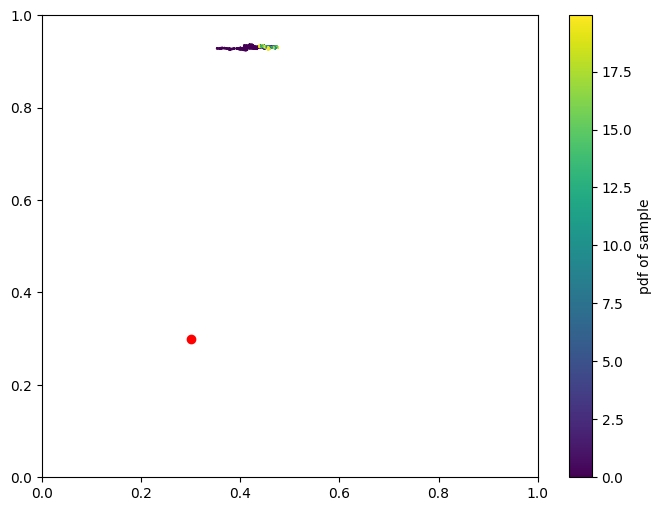

In [141]:
# Visualize these samples in original parametric space
axes = [0,1]
xs = []
ys = []
zs = []
for i,p in enumerate(mcmc.xs):
    po = norm_to_orig(p)
    xs.append(po.cpu()[axes[0]])
    ys.append(po.cpu()[axes[1]])
    u = mcmc.Us[i] - (-(po * (1-po)).log().sum(axis=-1))
    zs.append((-u).exp().cpu())

plt.figure(figsize=(8, 6))
plt.scatter(xs, ys, c=zs, s=0.6)
# plt.plot(xs, ys, color='gray', linewidth=0.1)
# plt.scatter(xs, ys, c=zs, s=0.2)
plt.xlim(0, 1)
plt.ylim(0, 1)
cbar = plt.colorbar()
cbar.set_label('pdf of sample')


# visualize the ground truth
# gt = orig_to_norm(torch.tensor(diffuse_gt))
plt.scatter(0.3, 0.3, color='red')


In [72]:
# sensitivity test

a = []
for _ in tqdm(range(200)):
    img = renderer(scene)
    i = img[0][128][128][1:2].item()
    print(i)
    a.append(i)
    
a = np.array(a)
print(np.std(a))


  0%|          | 0/200 [00:00<?, ?it/s]

5.279608249664307
5.32054328918457
5.278714179992676
5.322336673736572
5.2729268074035645
5.3159942626953125
5.285704612731934
5.296314239501953
5.317360877990723
5.322794437408447
5.316786289215088
5.315689563751221
5.290567398071289
5.2829461097717285
5.2671122550964355
5.304169178009033
5.312256336212158
5.3123979568481445
5.309272766113281
5.318844795227051
5.284608840942383
5.312285900115967
5.3207292556762695
5.316372394561768
5.299293518066406
5.287035942077637
5.319039821624756
5.300971031188965
5.296370029449463
5.302031517028809
5.354125022888184
5.308492183685303
5.295714378356934
5.321961879730225
5.296182632446289
5.316961288452148
5.294921398162842
5.308591842651367
5.278858184814453
5.319576740264893
5.315244674682617
5.28355598449707
5.288854122161865
5.291995525360107
5.315044403076172
5.303897380828857
5.315403938293457
5.295652389526367
5.281497478485107
5.24736213684082
5.300258636474609
5.308648109436035
5.298280239105225
5.28042459487915
5.335378170013428
5.295730

In [71]:
I_t[0][128][128][1:2].item()

5.304628372192383

In [74]:
for _ in tqdm(range(200)):
    a = U_orig(torch.tensor([0.3, 0.3, 0.3]).cuda())[0].item()
    print(math.exp(-a))

  0%|          | 0/200 [00:00<?, ?it/s]

19.847785168313123
8.404151140179748
17.838645628294746
19.174162893998382
19.44928663211511
18.41073330702463
15.626793287821142
12.544577874517923
11.607293978868968
19.93496591898682
6.735658037344839
11.187297107904278
16.264898713793958
18.421437923443893
4.743964047348919
4.900693899399264
19.90805436005231
10.626211039538386
11.536755210884898
17.485979915529896
13.7772409796025
5.568466454928509
1.6695122517284446
19.947094168649617
8.329998463402573
15.776485992208364
19.60879861589469
17.410219005466313
19.663283006234792
12.82398460683072
19.361303057277333
19.906616237638456
18.33848008033814
12.923368814941668
19.735005346437887
17.065050754374294
10.730378415648879
12.2372859268699
17.148240614810682
3.566288371095105
12.54918763721259
15.205250947554175
16.63684407757464
17.12617714130974
13.08511425123638
19.33072252756218
7.839955737576925
19.666841590029282
19.947103680167583
18.24555275614727
13.629177463024222
19.893924448639968
18.527855156497502
11.72742686452294


In [80]:
# compute posterior probability on a regular 3D grid
res = 20
Us = []
rmin=0.25
rmax=0.35
r=1j*res
X, Y, Z = np.mgrid[rmin:rmax:r, rmin:rmax:r, rmin:rmax:r]
X = X.flatten().astype('float32')
Y = Y.flatten().astype('float32')
Z = Z.flatten().astype('float32')
for i in tqdm(range(len(X))):
    u = U_orig(torch.tensor([X[i], Y[i], Z[i]]).cuda())[0].cpu()
    u = (-u).exp()
    Us.append(u)

  0%|          | 0/8000 [00:00<?, ?it/s]

In [81]:
Us = list(map(lambda x:x.item(), Us))
import plotly.graph_objects as go
s = Us
scatter = go.Scatter3d(
    x=X,
    y=Y,
    z=Z,
    mode='markers',
    marker=dict(
        size=20 * s,
        color=s,
        colorscale='jet',
        line=dict(width=0),
        colorbar=dict(
            title="Colorbar Title", # you can put any title you want here
        )
    )
)
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='diffuse'),
        yaxis=dict(title='specular'),
        zaxis=dict(title='roughness'),
    )
)

fig = go.Figure(data=[scatter], layout=layout)
fig.show()

In [82]:
# compute posterior probability on a regular 3D grid
res = 20
Us = []
rmin=0.28
rmax=0.32
r=1j*res
X, Y, Z = np.mgrid[rmin:rmax:r, rmin:rmax:r, rmin:rmax:r]
X = X.flatten().astype('float32')
Y = Y.flatten().astype('float32')
Z = Z.flatten().astype('float32')
for i in tqdm(range(len(X))):
    u = U_orig(torch.tensor([X[i], Y[i], Z[i]]).cuda())[0].cpu()
    u = (-u).exp()
    Us.append(u)

  0%|          | 0/8000 [00:00<?, ?it/s]

In [ ]:
Us = list(map(lambda x:x.item(), Us))

In [85]:
import plotly.graph_objects as go
s = Us
scatter = go.Scatter3d(
    x=X,
    y=Y,
    z=Z,
    mode='markers',
    marker=dict(
        size=20 * s,
        color=s,
        colorscale='jet',
        line=dict(width=0),
        colorbar=dict(
            title="Colorbar Title", # you can put any title you want here
        )
    )
)
layout = go.Layout(
    scene=dict(
        xaxis=dict(dtick=0.01, title='diffuse'),
        yaxis=dict(dtick=0.01, title='specular'),
        zaxis=dict(dtick=0.01, title='roughness'),
    )
)

fig = go.Figure(data=[scatter], layout=layout)
fig.show()

In [143]:
res = 20
Us = []
rmin=0
rmax=1
r=1j*res
Y, Z = np.mgrid[rmin:rmax:r, rmin:rmax:r]
Y = Y.flatten().astype('float32')
Z = Z.flatten().astype('float32')
for i in tqdm(range(len(Y))):
    u = U_orig(torch.tensor([0.3, Y[i], Z[i]]).cuda())[0].cpu()
#     u = (-u).exp()
    Us.append(u)
Z = np.array(Us).reshape((res,res))

  0%|          | 0/400 [00:00<?, ?it/s]

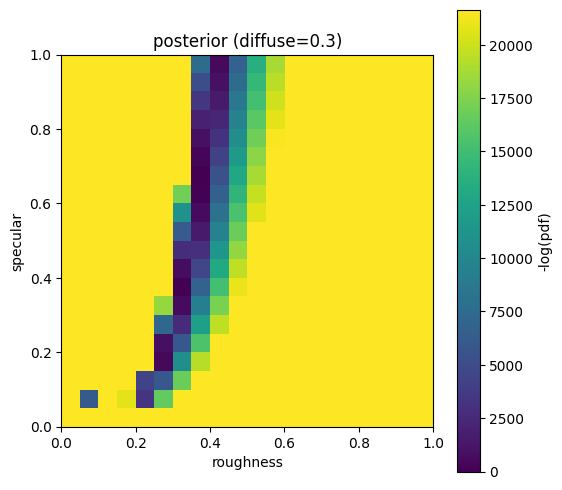

In [151]:
plt.figure(figsize=(6,6))
plt.imshow(Z, origin='lower', extent=[0, 1, 0, 1], cmap='viridis', vmax=np.quantile(Z, 0.2))
plt.colorbar(label='-log(pdf)')
plt.xlabel('roughness')
plt.ylabel('specular')
plt.title('posterior (diffuse=0.3)')
plt.show()